In [1]:
import sys
import pickle
import tensorflow as tf
sys.path.append("/visuworks/Blindless_AIFFELTON/Ablation Study/")

# import customized modules
import preprocess, data_generator, check_result, metrics, loss, train

sys.path.append("/visuworks/Blindless_AIFFELTON/Ablation Study/SD_Unet")
import sd_unet

# Insert Path
# {model_name}_{epoch}ep_{model_inpusize}_{Generator | aG/fG/sG}
FILE_NAME = 'sd_unet_50ep_1024_fG_wo_slice'
INPUT_SHAPE = (1024, 1024, 1)
MODEL_PATH = "/visuworks/Blindless_AIFFELTON/Ablation Study/SD_Unet/model_parameters/" + FILE_NAME + ".tf"
HISTORY_PATH = "/visuworks/Blindless_AIFFELTON/Ablation Study/SD_Unet/history/" + FILE_NAME + '_history' ".json"

TRAIN_SOURCE = '/visuworks/Dataset/Selected Dataset 3/Train'
TEST_SOURCE = '/visuworks/Dataset/Selected Dataset 3/Test'

2024-02-16 14:23:08.115366: I tensorflow/core/util/port.cc:113] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2024-02-16 14:23:08.166723: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-02-16 14:23:08.166760: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-02-16 14:23:08.168197: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2024-02-16 14:23:08.176788: I tensorflow/core/platform/cpu_feature_guar

2024-02-16 14:14:33.612558: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1929] Created device /job:localhost/replica:0/task:0/device:GPU:0 with 20763 MB memory:  -> device: 0, name: NVIDIA L4, pci bus id: 0000:00:03.0, compute capability: 8.9
2024-02-16 14:14:36.826319: I external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:454] Loaded cuDNN version 8904


=====ChaseDB_t6.jpg result======
sensitivity: 0.7247146366132062
specificity: 0.984479930069061
IOU: 0.6139416750818568


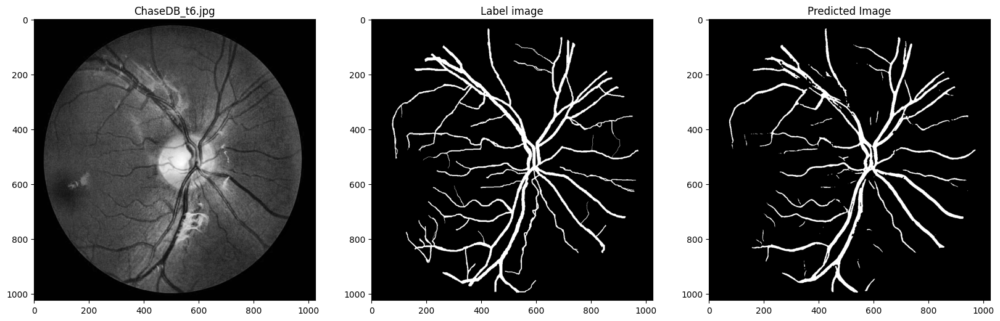

=====ChaseDB_n9.jpg result======
sensitivity: 0.8187596763993982
specificity: 0.9846633460764294
IOU: 0.7058265111426504


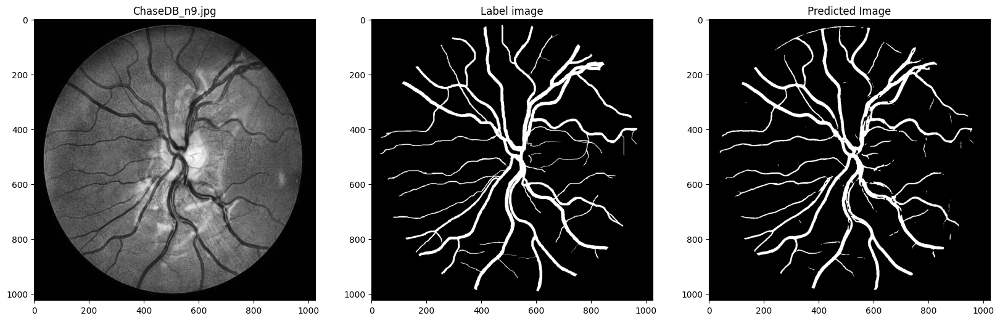

=====ChaseDB_t2.jpg result======
sensitivity: 0.8896681539319576
specificity: 0.9811722505671255
IOU: 0.7080854936079546


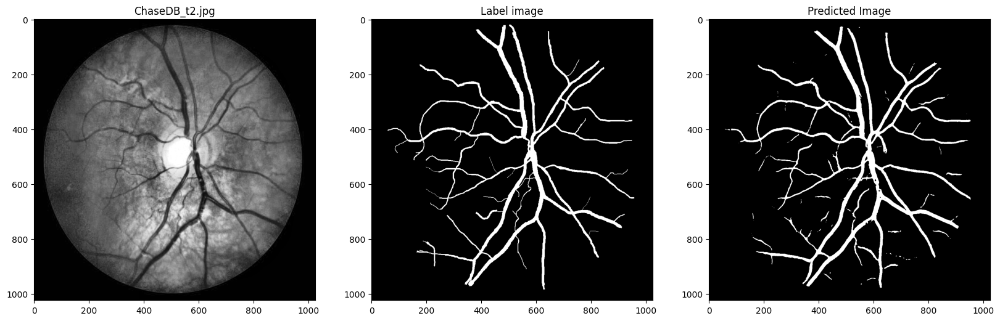

=====ChaseDB_t7.jpg result======
sensitivity: 0.8175642164269484
specificity: 0.9863995084610611
IOU: 0.7103757228330043


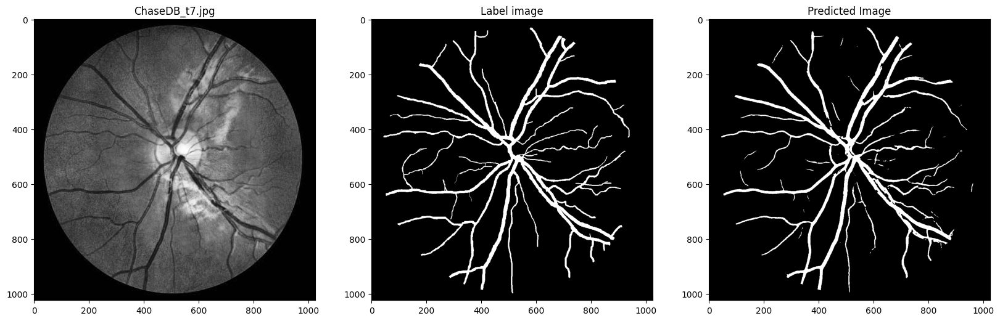

=====ChaseDB_n16.jpg result======
sensitivity: 0.831730237700387
specificity: 0.9802775310674121
IOU: 0.6738355891719745


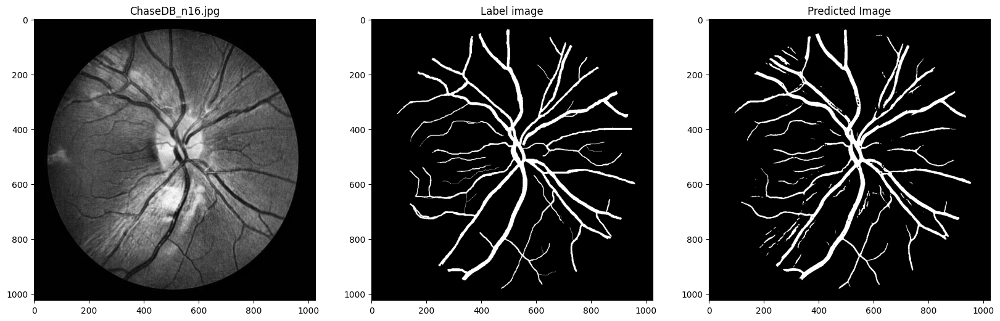

=====ChaseDB_t5.jpg result======
sensitivity: 0.8017514017514018
specificity: 0.9856347069936268
IOU: 0.6820920161221165


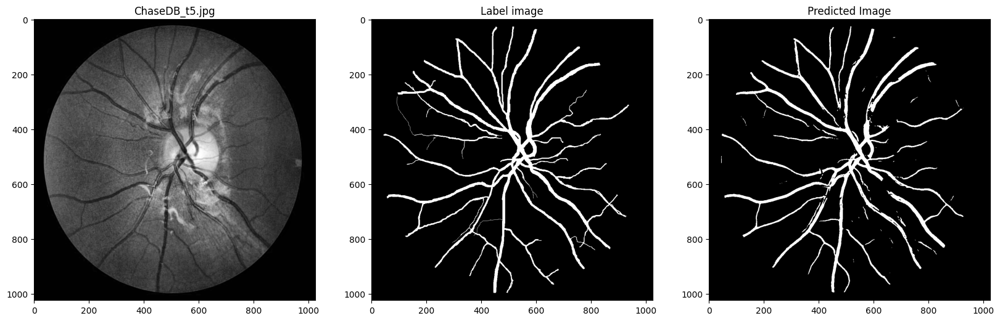

=====ChaseDB_t4.jpg result======
sensitivity: 0.8236902003820672
specificity: 0.9821914953629057
IOU: 0.7028430718007855


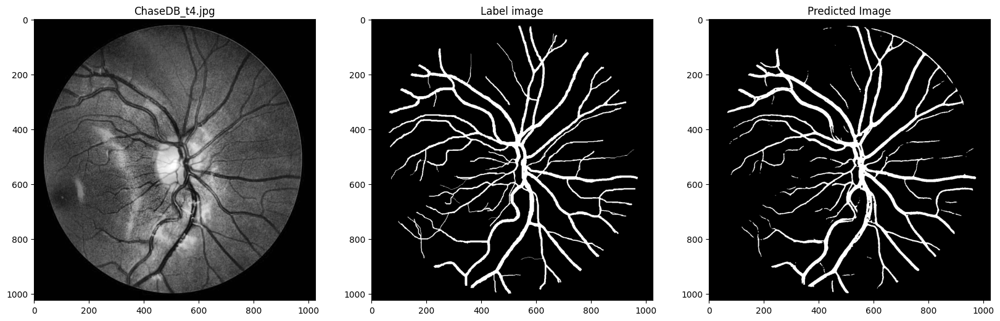

=====ChaseDB_t3.jpg result======
sensitivity: 0.8037015099084495
specificity: 0.9810226336044185
IOU: 0.6766254899216125


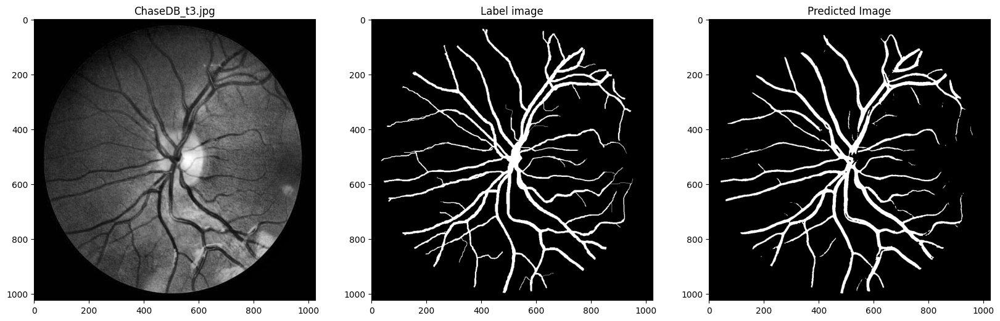

In [2]:
# Define custom objects for loading the model
custom_objects = {'DiceLoss': loss.DiceLoss(), 
                  'sensitivity': metrics.sensitivity,
                  'specificity': metrics.specificity,
                  'accuracy' : metrics.accuracy}
MODEL_PATH = '/visuworks/Blindless_AIFFELTON/Ablation Study/SD_Unet/model_parameters/sd_unet_50ep_1024_fg_wo_slice.tf/49--0.2333-0.7441-0.9800-0.2125-0.7810-0.9801.pb'
TEST_SOURCE = '/visuworks/Dataset/Selected Dataset 3/Test'
test_preproc = preprocess.build_augmentation_for_general(INPUT_SHAPE[0], INPUT_SHAPE[0], is_train=False)
model = tf.keras.models.load_model(MODEL_PATH, custom_objects=custom_objects)

# file_list = ["AFIO", "ARIA", "Chase", "DR_HAGIS", "DRIVE", "DualModal", "FIVES", "HRF", "IOSTAR", "LES-AV", "ORVS", "RETA", "STARE", "TREND", "UoA-DR"]
# for file in file_list:
metrics.plot_result(TEST_SOURCE, "Chase", model=model, img_size=INPUT_SHAPE, preproc=test_preproc)

=====DualModal2019_C9_L4.jpg result======
sensitivity: 0.9622869607495302
specificity: 0.9531679477621533
IOU: 0.6020107855710105


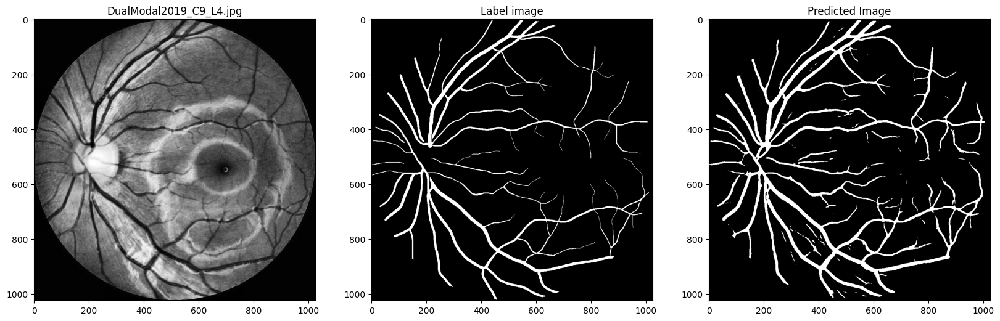

=====DualModal2019_C5_R1.jpg result======
sensitivity: 0.9560237941661291
specificity: 0.9514584531640939
IOU: 0.5687085386858576


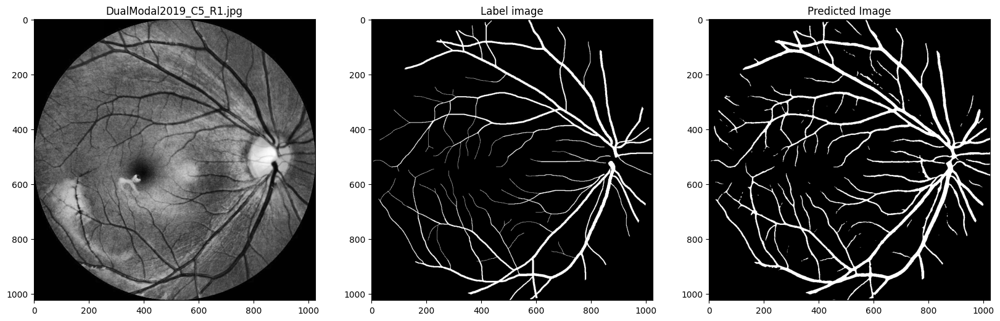

=====DualModal2019_C5_L1.jpg result======
sensitivity: 0.9508659536348336
specificity: 0.9548374192224843
IOU: 0.5951828724353256


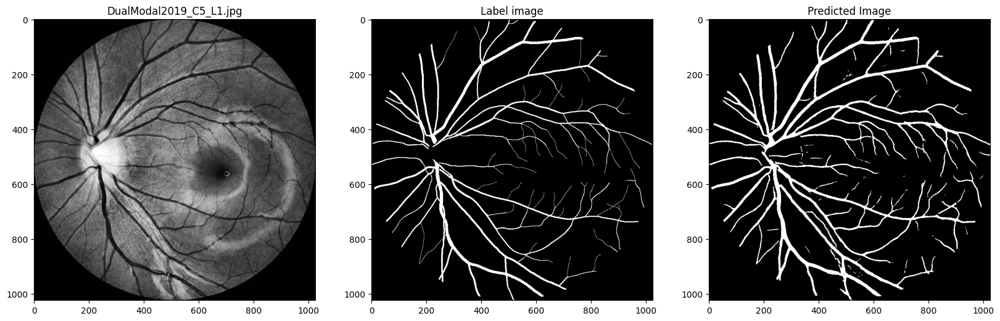

=====DualModal2019_C1_R4.jpg result======
sensitivity: 0.9505823234636794
specificity: 0.9600977740730766
IOU: 0.6169001396333499


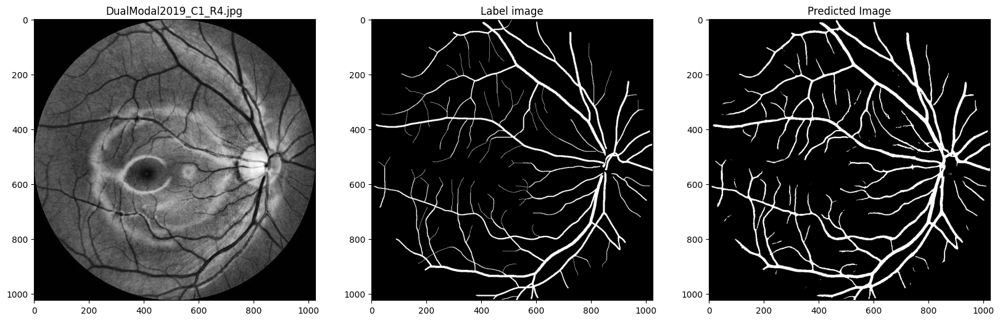

=====DualModal2019_C6_R2.jpg result======
sensitivity: 0.9485590417697246
specificity: 0.9577671742046466
IOU: 0.6029802757682557


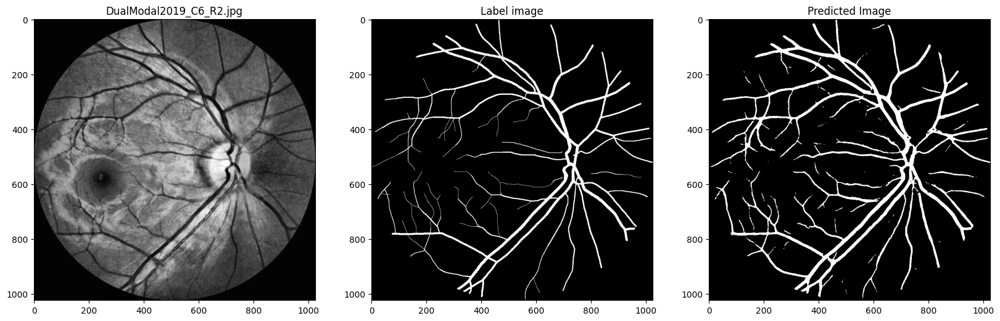

=====DualModal2019_A6_R3.jpg result======
sensitivity: 0.9576485674754497
specificity: 0.944238913990559
IOU: 0.49598447973014304


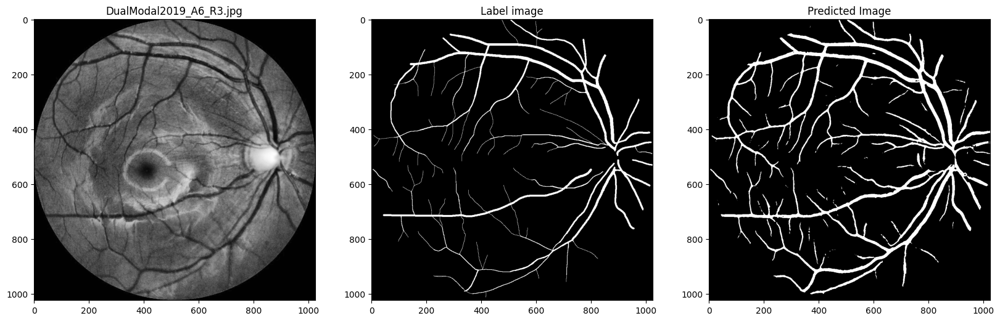

=====DualModal2019_A2_R2.jpg result======
sensitivity: 0.9160688060230592
specificity: 0.9647885402041974
IOU: 0.5768482593675259


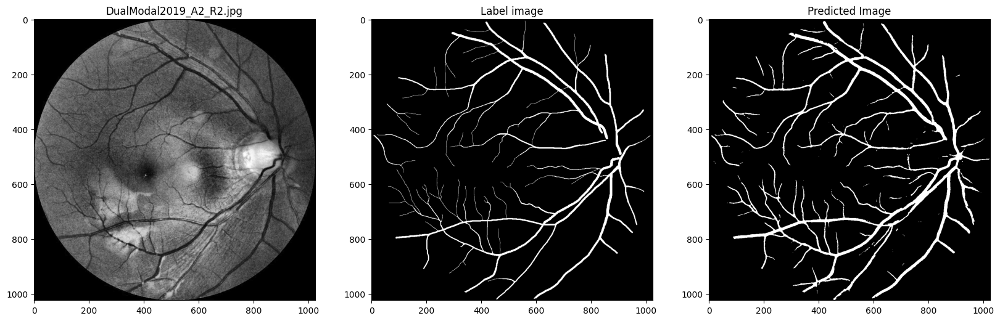

In [3]:
# Define custom objects for loading the model
custom_objects = {'DiceLoss': loss.DiceLoss(), 
                  'sensitivity': metrics.sensitivity,
                  'specificity': metrics.specificity,
                  'accuracy' : metrics.accuracy}
MODEL_PATH = '/visuworks/Blindless_AIFFELTON/Ablation Study/SD_Unet/model_parameters/sd_unet_50ep_1024_fg_wo_slice.tf/49--0.2333-0.7441-0.9800-0.2125-0.7810-0.9801.pb'
TEST_SOURCE = '/visuworks/Dataset/Selected Dataset 3/Test'
test_preproc = preprocess.build_augmentation_for_general(INPUT_SHAPE[0], INPUT_SHAPE[0], is_train=False)
model = tf.keras.models.load_model(MODEL_PATH, custom_objects=custom_objects)

# file_list = ["AFIO", "ARIA", "Chase", "DR_HAGIS", "DRIVE", "DualModal", "FIVES", "HRF", "IOSTAR", "LES-AV", "ORVS", "RETA", "STARE", "TREND", "UoA-DR"]
# for file in file_list:
metrics.plot_result(TEST_SOURCE, "DualModal", model=model, img_size=INPUT_SHAPE, preproc=test_preproc)

=====HRF_02_h.jpg result======
sensitivity: 0.883447316564275
specificity: 0.9752754345792612
IOU: 0.7207660178107022


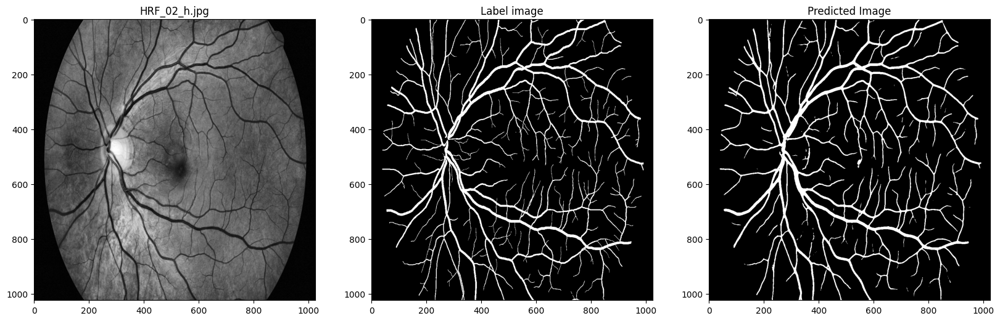

=====HRF_03_h.jpg result======
sensitivity: 0.7897821159941127
specificity: 0.9782529650927835
IOU: 0.6669564289091214


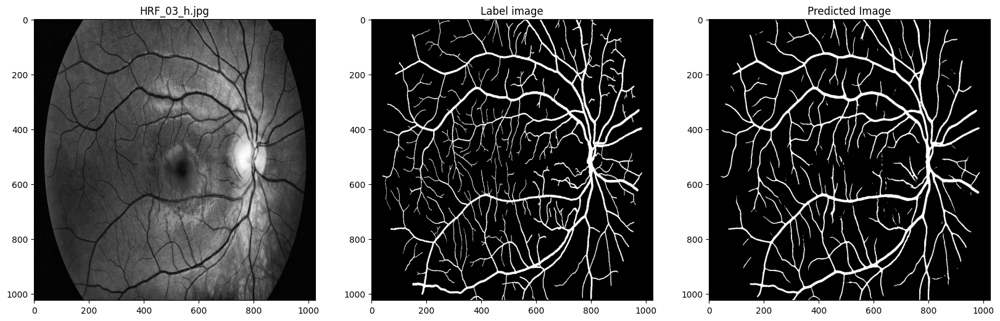

=====HRF_05_g.jpg result======
sensitivity: 0.8906437016493942
specificity: 0.9639238581891424
IOU: 0.5874628130204974


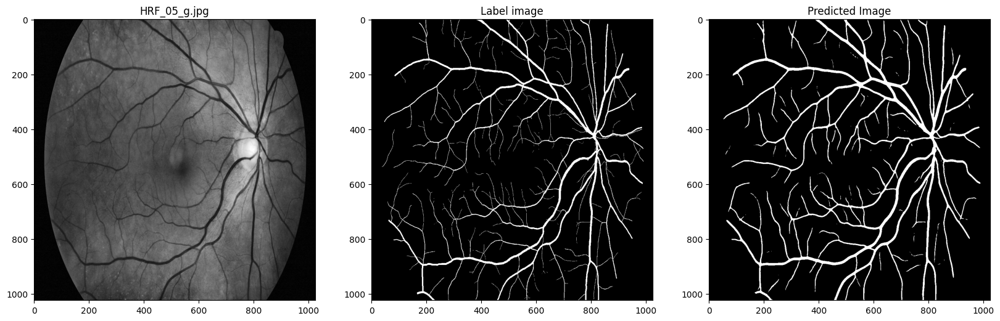

=====HRF_06_h.jpg result======
sensitivity: 0.8751692874877737
specificity: 0.9707210840458138
IOU: 0.6948758923504287


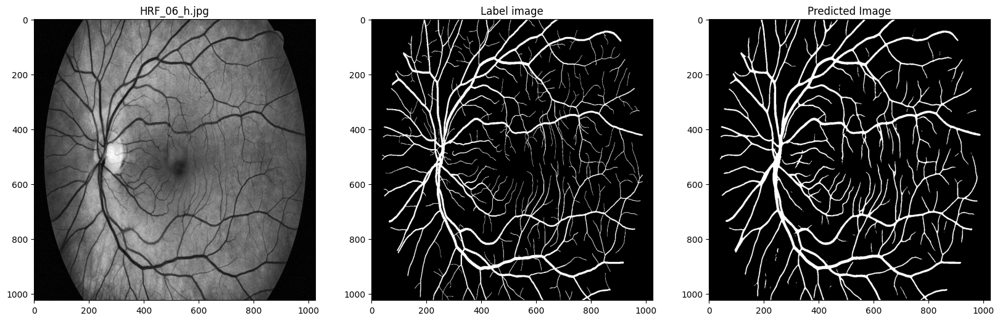

=====HRF_01_h.jpg result======
sensitivity: 0.8131848577369022
specificity: 0.975643500438521
IOU: 0.6693777801762353


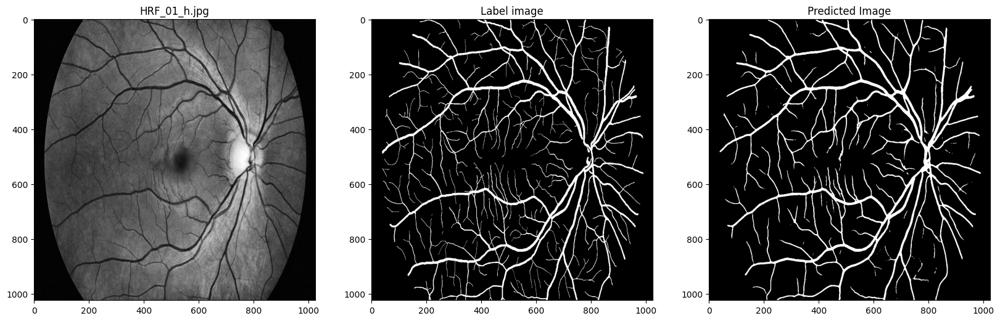

=====HRF_01_dr.JPG result======
sensitivity: 0.8981219300780121
specificity: 0.9405206880704087
IOU: 0.3274757690686894


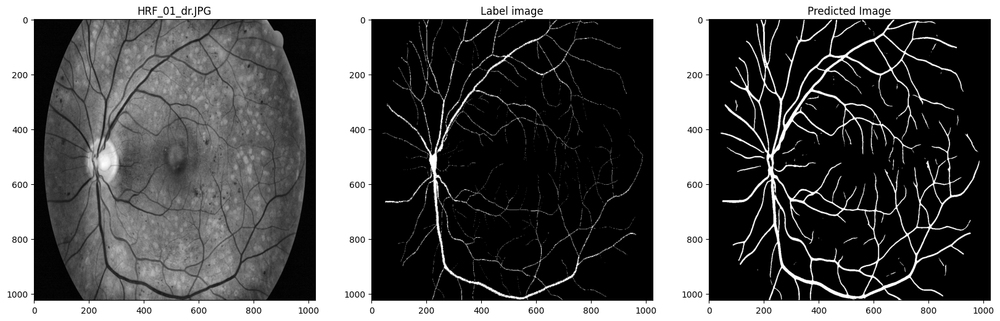

=====HRF_01_dr.JPG result======
sensitivity: 0.884238529703805
specificity: 0.9555907913894608
IOU: 0.4837198815246021


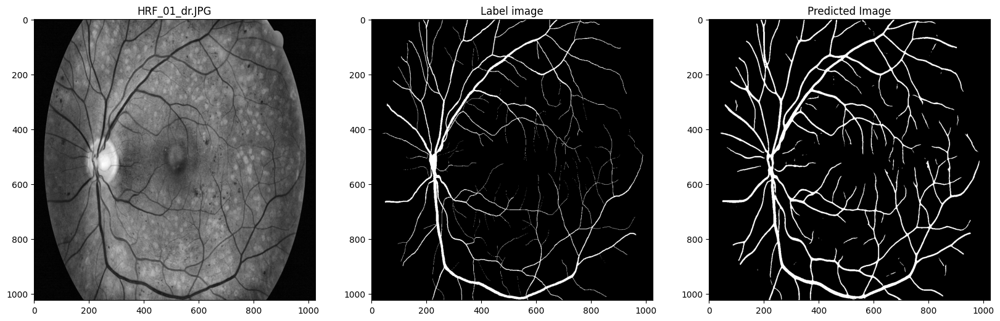

=====HRF_03_g.jpg result======
sensitivity: 0.8757342599487052
specificity: 0.9689396553730693
IOU: 0.5807828634762474


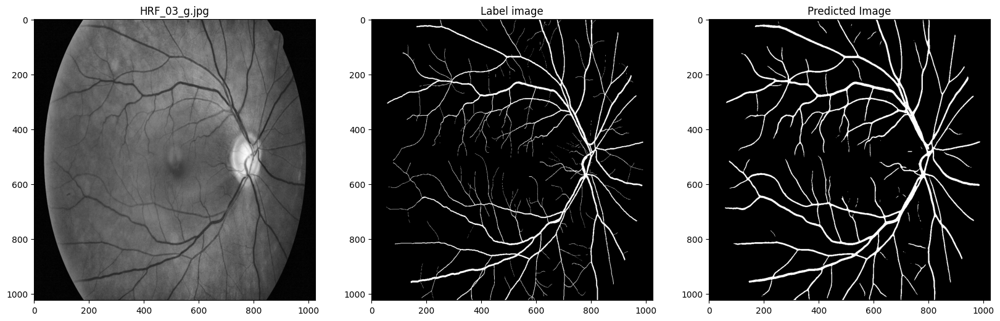

=====HRF_01_g.jpg result======
sensitivity: 0.875410210313044
specificity: 0.9563000132857771
IOU: 0.5436967194229304


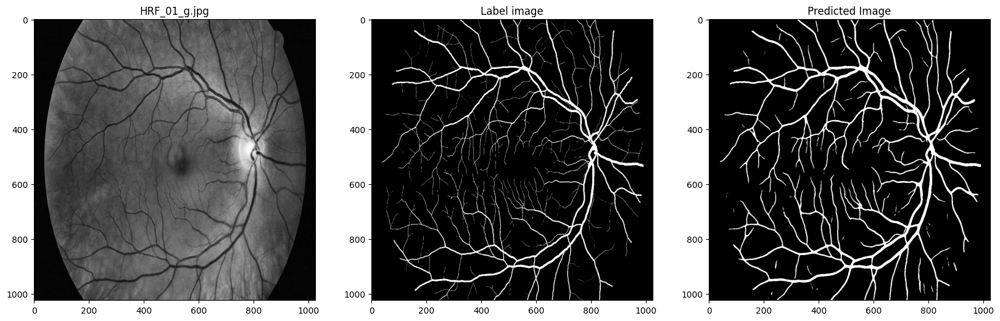

=====HRF_03_dr.JPG result======
sensitivity: 0.873340509508432
specificity: 0.9496807118997269
IOU: 0.39485210620234684


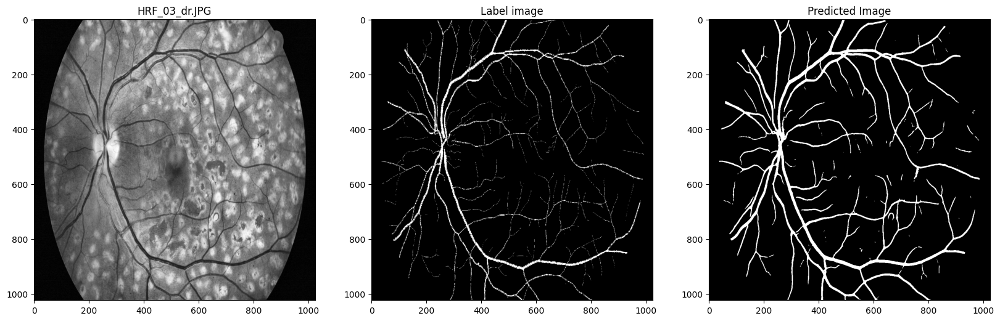

=====HRF_03_dr.JPG result======
sensitivity: 0.8539869755120705
specificity: 0.9664916353434021
IOU: 0.5616405682878772


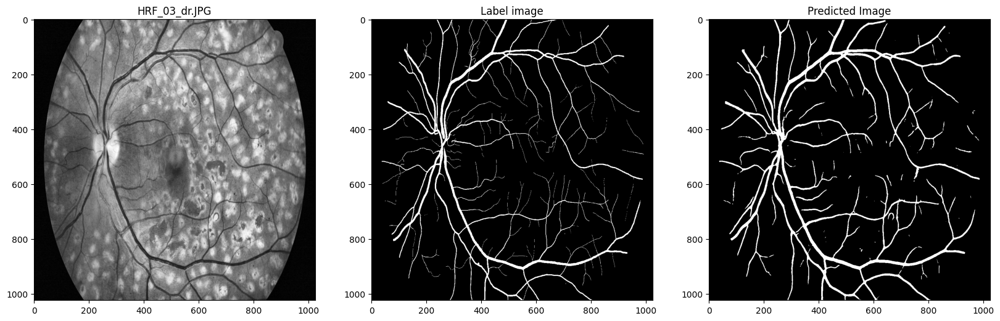

=====HRF_07_g.jpg result======
sensitivity: 0.8574318381706244
specificity: 0.9629787546564718
IOU: 0.5596762156266146


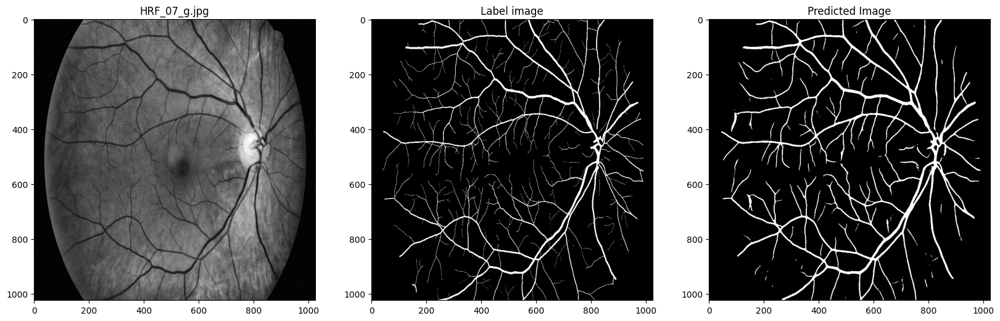

=====HRF_02_g.jpg result======
sensitivity: 0.8778666051707792
specificity: 0.9577412979819108
IOU: 0.5754827114145817


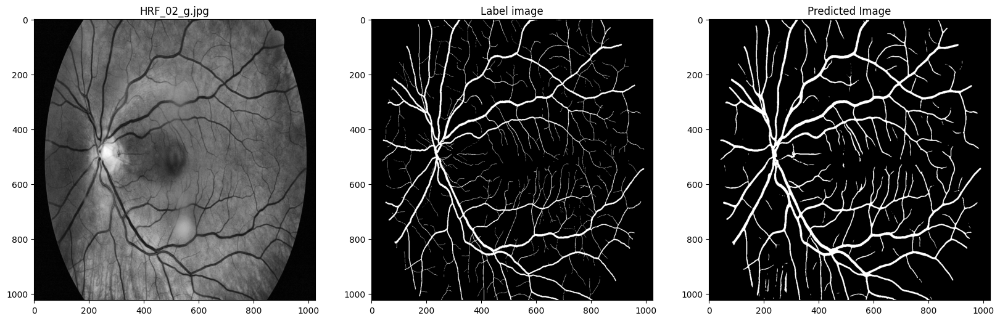

=====HRF_02_dr.JPG result======
sensitivity: 0.8864715652560413
specificity: 0.9439069662934754
IOU: 0.3821230853005536


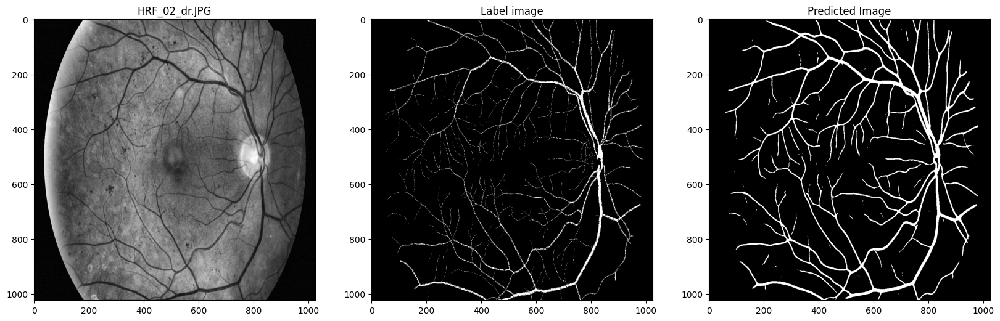

=====HRF_02_dr.JPG result======
sensitivity: 0.8691945254655598
specificity: 0.9631219053071086
IOU: 0.563851774226414


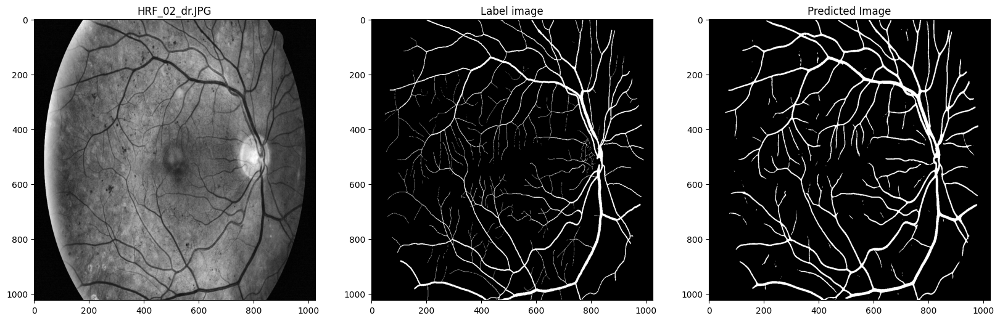

=====HRF_10_h.jpg result======
sensitivity: 0.8057623288581682
specificity: 0.9779787123030367
IOU: 0.6530943894270913


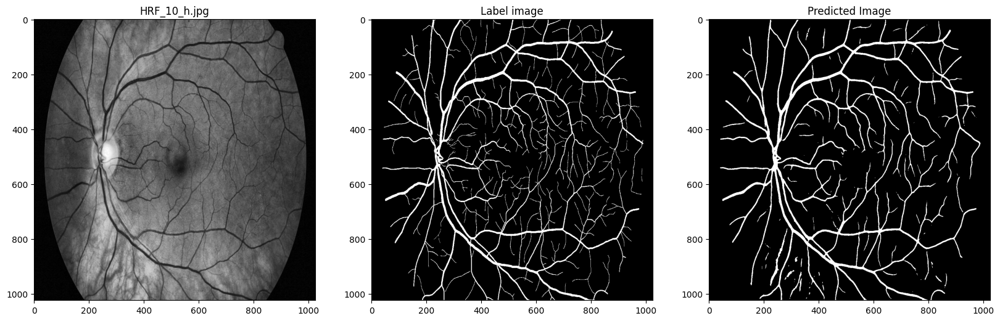

In [3]:
# Define custom objects for loading the model
custom_objects = {'DiceLoss': loss.DiceLoss(), 
                  'sensitivity': metrics.sensitivity,
                  'specificity': metrics.specificity,
                  'accuracy' : metrics.accuracy}
MODEL_PATH = '/visuworks/Blindless_AIFFELTON/Ablation Study/SD_Unet/model_parameters/sd_unet_50ep_1024_fg_wo_slice.tf/49--0.2333-0.7441-0.9800-0.2125-0.7810-0.9801.pb'
TEST_SOURCE = '/visuworks/Dataset/Selected Dataset 3/Test'
test_preproc = preprocess.build_augmentation_for_general(INPUT_SHAPE[0], INPUT_SHAPE[0], is_train=False)
model = tf.keras.models.load_model(MODEL_PATH, custom_objects=custom_objects)

# file_list = ["AFIO", "ARIA", "Chase", "DR_HAGIS", "DRIVE", "DualModal", "FIVES", "HRF", "IOSTAR", "LES-AV", "ORVS", "RETA", "STARE", "TREND", "UoA-DR"]
# for file in file_list:
metrics.plot_result(TEST_SOURCE, "HRF", model=model, img_size=INPUT_SHAPE, preproc=test_preproc)